In [1]:
import os
import pickle
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
import collections
%matplotlib inline

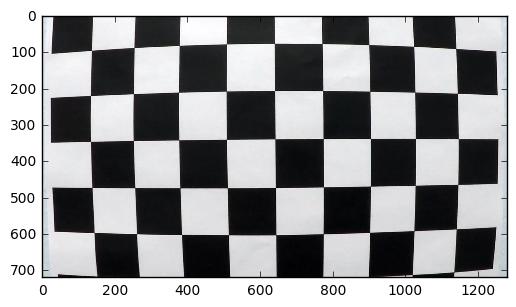

In [2]:
# prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

# Make a list of calibration images
fname = 'camera_cal/calibration1.jpg'
img = cv2.imread(fname)
image_shape = img.shape
plt.imshow(img)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)


# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [4]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

In [5]:
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
#         cv2.imshow('img', img)
#         cv2.imwrite(write_name, img)


In [6]:
import pickle
%matplotlib inline
fname = 'camera_cal/calibration{}.jpg'.format(2)

img = cv2.imread( fname)
img_size = (img.shape[1], img.shape[0])

In [7]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

In [8]:
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

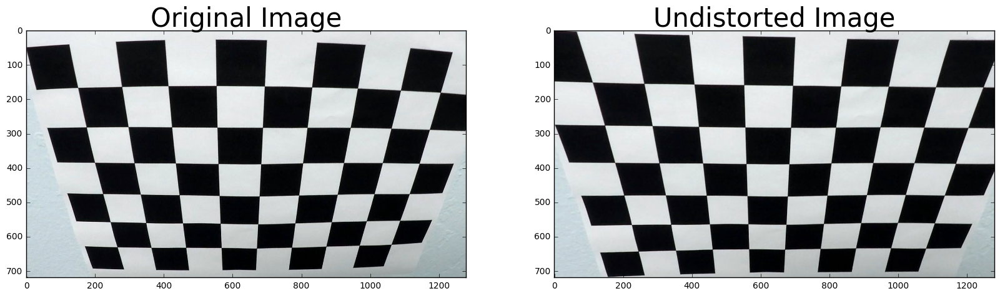

In [9]:
dst = cv2.undistort(img, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [10]:
images = glob.glob('test_images/*.jpg')
print(images)

['test_images/solidWhiteRight.jpg', 'test_images/solidYellowLeft.jpg', 'test_images/test1.jpg', 'test_images/test2.jpg', 'test_images/test3.jpg', 'test_images/test4.jpg', 'test_images/test5.jpg', 'test_images/test6.jpg']


In [11]:
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [12]:
def warp(img):
    
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M
    

In [13]:
def unwarp(img):
    
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    M = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M

In [14]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):    
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x' :
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel).astype(float)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1.0
    # 6) Return this mask as your binary_output image

    return sxbinary

def HLS(img, l_thresh_min=180, l_thresh_max=255):
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2] 

    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    return l_binary

def LUV(img, l_thresh_min=255, l_thresh_max=255):
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0] 

    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    return l_binary

def LAB(img, l_thresh_min=225, l_thresh_max=255):
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2] 

    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    return l_binary

def mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):    
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        dir_binary =  np.zeros_like(absgraddir)
        dir_binary[(absgraddir > thresh[0]) & (absgraddir < thresh[1])] = 1
    # Return the result
    return dir_binary


In [15]:
def apply_thresholds(img,show=True):
    img = undistort(img,mtx, dist)
    final,m = warp(img)
    
    binary = HLS(final)
    grad_binary = abs_sobel_thresh(final, orient='x', thresh_min=30, thresh_max=200)
    binary1 = dir_threshold(final, sobel_kernel=5, thresh = (.65, 1.05))
    binary2 = mag_thresh(final, sobel_kernel=5, mag_thresh=(30, 255))
    binary3 = LUV(final,220,255)
    binary4 = LAB(final,155,200)
    
    combined = np.zeros_like(binary)
    combined[((binary == 1)|(binary4 == 1)|(binary3==1))] = 1
    return combined
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(final)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('Thresholded Gradient', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    else:
        return combined

In [16]:
ym_per_pix=30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

In [17]:
def find_curvature(yvals, fitx):
    ym_per_pix=30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Define y-value where we want radius of curvature
    y = np.max(yvals)
    p= np.polyfit(yvals*ym_per_pix, fitx*xm_per_pix, 2)
    radiusCurvature = ((1 + (2*p[0]*y + p[1])**2)**1.5)/np.absolute(2*p[0])
    return radiusCurvature

In [18]:
def slidingWindow(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    return leftx, lefty, rightx, righty

In [19]:
def extract_line(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return leftx, lefty, rightx, righty
    

In [20]:
def checkCurvature( curverad):
    if  abs(curverad)>40000.0:
        return False
    if  abs(curverad)<100.0:
        return False
    return True

def checkCurvature1(preCurve, curverad):
    if abs(curverad / lane.radius_of_curvature - 1) < .6:   
        return True
    else:
        return False
    

In [21]:
def check_direction(right, right_pre, right_pre2):
    if abs((right-right_pre) / (right_pre-right_pre2) - 1) < .2:
        return True
    else:
        return False

In [22]:
# draw poly on an image
# def draw_poly(image, warped, yvals, left_fitx, right_fitx, Minv):
def draw(image, warped, yvals, left_fitx, right_fitx, 
              left_lane_x, left_lane_y, right_lane_x, right_lane_y, Minv, curvature):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    position = find_position(pts)
    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)
    return result
    
    

In [23]:
def curavature(y_eval,left_fit_cr,right_fit_cr ):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad

In [24]:
def drawSimple(undist,warped,left_fitx,right_fitx,ploty, curvature, position):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    
    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)
    return result

In [25]:
def convertRGB(img):
    r,g,b = cv2.split(img)       # get b,g,r
    img = cv2.merge([b,g,r]) 
    return img

def convertBRG(img):
    b,r,g = cv2.split(img)       # get b,g,r
    img = cv2.merge([r,g,b]) 
    return img

In [26]:
def find_position(left,right):
    position = image_shape[1]/2
    ym_per_pix=30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    left  = left[ (left[:,0] > 700)]
    right = right[ (right[:,0] > 700)]

    minLeft = np.min(left)
    minRight = np.max(right)
    
    laneCentre = (minLeft + minRight)/2
    return (position - laneCentre)*xm_per_pix

In [27]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # flag to mark if the line was detected the last iteration
        self.detected = False

        # polynomial coefficients fitted on the last iteration
        self.last_fit_pixel = None

        # list of polynomial coefficients of the last N iterations
        self.recent_fits_pixel = collections.deque(maxlen=10)

        self.curvature = None
        self.recent_curvature = collections.deque(maxlen=10)
        
        self.position = None
        self.recent_position = collections.deque(maxlen=10)

        # store all pixels coords (x, y) of line detected
        self.all_x = None
        self.all_y = None
        
    def update_line(self, new_fit_pixel, detected, clear_buffer=False):
        self.detected = detected
        if clear_buffer:
            self.recent_fits_pixel = []
        self.last_fit_pixel = new_fit_pixel
        self.recent_fits_pixel.append(new_fit_pixel)
    def average_fit(self):
        return np.mean(self.recent_fits_pixel, axis=0)
    
    def average_curvature(self):
        return np.mean(self.recent_curvature)
    
    def average_position(self):
        return np.mean(self.recent_position)

In [28]:
index=0

def process_image(img):
    r,g,b = cv2.split(img)       # get b,g,r
    img = cv2.merge([b,g,r])     # switch it to rgb
    binary_warped=apply_thresholds(img)
    
    if left_lane.detected == False or right_lane.detected == False:    
        leftx, lefty, rightx, righty=slidingWindow(binary_warped)

        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        y_eval = max((max(righty), max(lefty)))

        left_lane.update_line(left_fit, True)
        right_lane.update_line(right_fit, True)

    elif left_lane.detected == True and right_lane.detected == True:  
        leftx, lefty, rightx, righty=extract_line(binary_warped, left_lane.last_fit_pixel, right_lane.last_fit_pixel)
        
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        y_eval = max((max(righty), max(lefty)))
        
        left_lane.update_line(left_fit, True)
        right_lane.update_line(right_fit, True)
        
    avg_left_fit = left_lane.average_fit()
    avg_right_fit = right_lane.average_fit()
        
    left_curverad, right_curverad = curavature(y_eval,avg_left_fit,avg_right_fit)
    
    left_lane.curvature = left_curverad
    left_lane.recent_curvature.append(left_curverad)
    
    right_lane.curvature = right_curverad
    right_lane.recent_curvature.append(right_curverad)
    
    avg_left_cur = left_lane.average_curvature()
    avg_right_cur = right_lane.average_curvature()
    
    avg_cur = (avg_left_cur+avg_right_cur)/2.

    ploty = np.linspace(0, 719, num=720)
    l = avg_left_fit[0]*ploty**2 + avg_left_fit[1]*ploty + avg_left_fit[2]
    r = avg_right_fit[0]*ploty**2 + avg_right_fit[1]*ploty + avg_right_fit[2]

    pts_left = np.zeros((ploty.shape[0],2))
    pts_left[:,0] = ploty
    pts_left[:,1] = l

    pts_right = np.zeros((ploty.shape[0],2))
    pts_right[:,0] = ploty
    pts_right[:,1] = r

    position = find_position(pts_left,pts_right)
    
    right_lane.position = position
    right_lane.recent_position.append(position)
        
    result=drawSimple(img,binary_warped, l,r,ploty, avg_cur , right_lane.average_position())
    
    return result

/Users/doddarliu/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


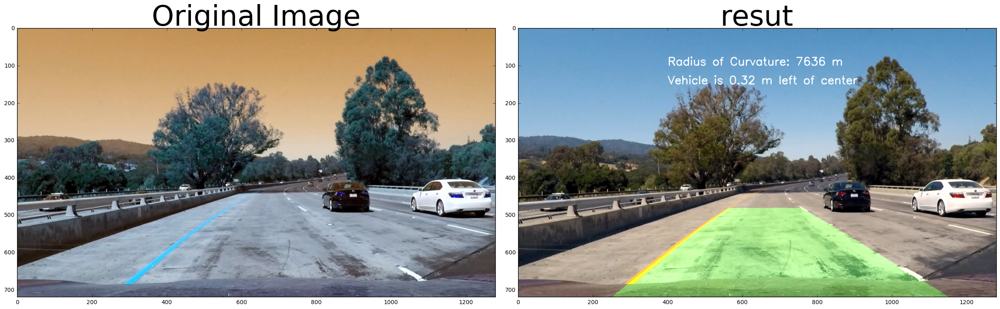

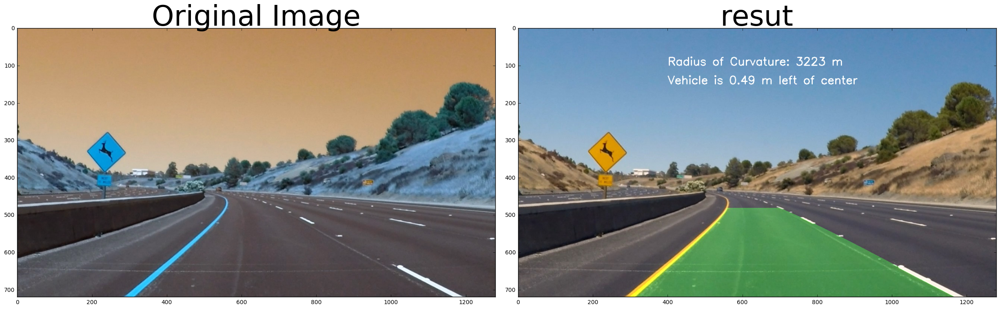

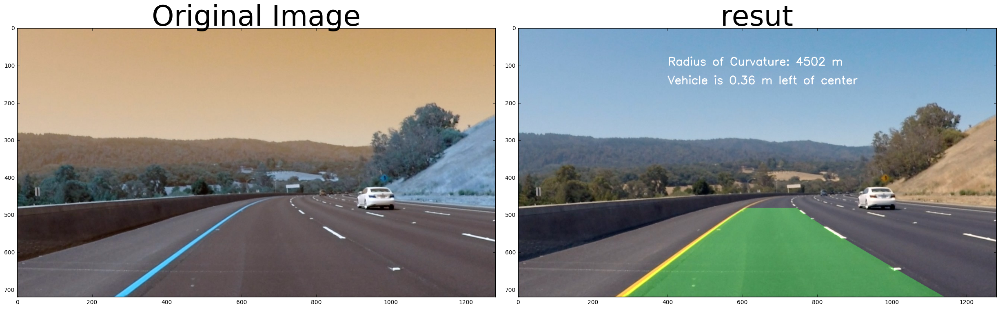

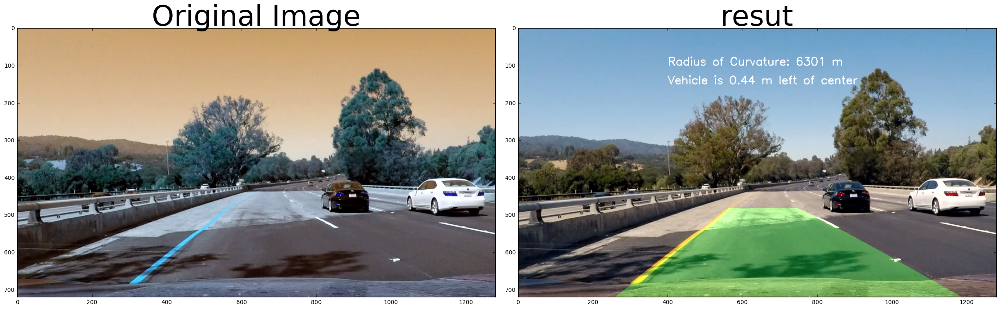

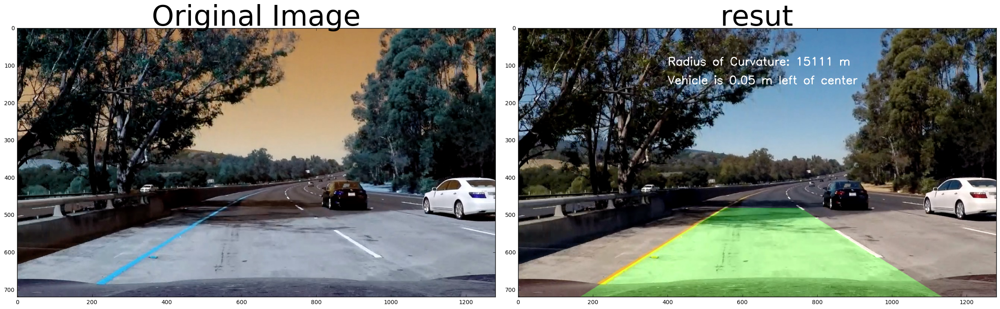

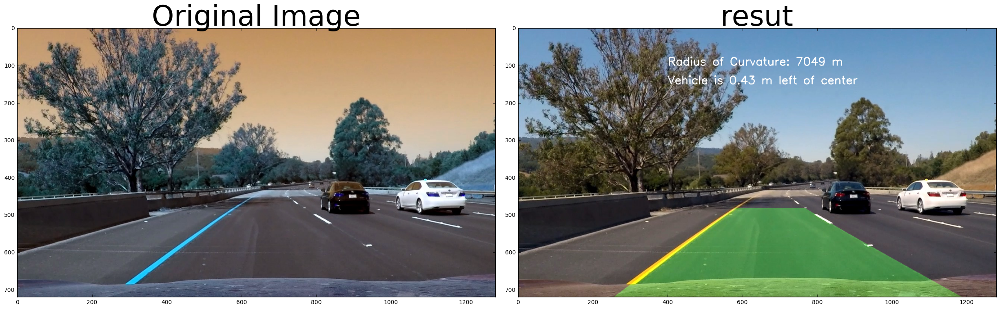

In [29]:
for i in range(1,7):
    left_lane = Line()
    right_lane = Line()
    fname = 'test_images/test{}.jpg'.format(i)
    img = cv2.imread(fname)
    result= process_image(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(result)
    ax2.set_title('resut', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
white_output = 'white.mp4'
left_lane = Line()
right_lane = Line()
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video white.mp4
[MoviePy] Writing video white.mp4


 25%|██▌       | 319/1261 [02:47<08:06,  1.94it/s]